In [1]:
# Импорт необходимых библиотек
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

In [2]:
# Параметры симуляции
Height, Width = 80, 200        
D_cyl = 10                     
R_cyl = D_cyl / 2.0

# Положение цилиндра
cyl_x = Width // 4
cyl_y = Height // 2

# Скорость на входе 
u_in = 0.08   

In [3]:
# D2Q9
Q = 9
c = np.array([
    [0,  0],   # 0
    [1,  0],   # 1  E
    [0,  1],   # 2  N
    [-1, 0],   # 3  W
    [0, -1],   # 4  S
    [1,  1],   # 5  NE
    [-1, 1],   # 6  NW
    [-1,-1],   # 7  SW
    [1, -1]    # 8  SE
])
w = np.array([
    4/9,
    1/9, 1/9, 1/9, 1/9,
    1/36, 1/36, 1/36, 1/36
])
opp = np.array([0, 3, 4, 1, 2, 7, 8, 5, 6])  # противоположные направления
cs2 = 1.0 / 3.0
cs = np.sqrt(cs2)

In [4]:
# Вязкость и число Рейнольдса
tau = 0.6                  
nu = cs2 * (tau - 0.5)      
Re_eff = u_in * D_cyl / nu
omega = 1.0 / tau            # частота релаксации

In [5]:
# Цилиндр
def create_cylinder_mask():
    y, x = np.indices((Height, Width))
    dist2 = (x - cyl_x)**2 + (y - cyl_y)**2
    solid = dist2 <= R_cyl**2
    return solid
solid = create_cylinder_mask()

In [6]:
# Начальные условия
rho = np.ones((Height, Width))
ux = np.zeros((Height, Width))
uy = np.zeros((Height, Width))

In [7]:
def feq(rho, ux, uy):
    """
    Равновесное распределение f_i^eq для D2Q9
    """
    feq_ = np.zeros((Q, Height, Width))
    u2 = ux**2 + uy**2
    for i in range(Q):
        cu = c[i,0]*ux + c[i,1]*uy
        feq_[i] = rho * w[i] * (
            1 + 3*cu + 4.5*cu**2 - 1.5*u2
        )
    return feq_
# Начальное распределение
f = feq(rho, ux, uy)

In [8]:
# Поток и столкновение
def stream(f):
    """
    Streaming: f_i(x + c_i, t+1) = f_i(x, t)
    """
    for i in range(Q):
        cx, cy = c[i]
        if cx != 0:
            f[i] = np.roll(f[i], shift=cx, axis=1)
        if cy != 0:
            f[i] = np.roll(f[i], shift=cy, axis=0)

def collide(f):
    """
    BGK-столкновение: f <- f - omega (f - feq)
    """
    global rho, ux, uy

    rho = np.sum(f, axis=0)
    # защита от нулевой плотности
    rho = np.clip(rho, 1e-6, 10.0)

    ux = np.sum(f * c[:,0].reshape(Q,1,1), axis=0) / rho
    uy = np.sum(f * c[:,1].reshape(Q,1,1), axis=0) / rho

    # внутри цилиндра скорость = 0
    ux[solid] = 0.0
    uy[solid] = 0.0

    feq_ = feq(rho, ux, uy)
    f += -omega * (f - feq_)

def apply_bounce_back(f):
    """
    Bounce-back на твёрдом теле (цилиндр)
    """
    for i in range(Q):
        j = opp[i]
        f_i = f[i]
        f_j = f[j]
        tmp = f_i[solid].copy()
        f_i[solid] = f_j[solid]
        f_j[solid] = tmp


In [9]:
# Граничные условия Zou–He
def apply_zou_he_inlet(f, u_in):
    """
    Zou–He на входе (x=0): задаём u_x = u_in, u_y = 0.
    """
    x = 0
    f0 = f[0,:,x]
    f2 = f[2,:,x]
    f3 = f[3,:,x]
    f4 = f[4,:,x]
    f6 = f[6,:,x]
    f7 = f[7,:,x]
    rho_b = (f0 + f2 + f4 + 2*(f3 + f6 + f7)) / (1 - u_in)
    f[1,:,x] = f[3,:,x] + (2/3)*rho_b*u_in
    f[5,:,x] = f[7,:,x] + 0.5*(f4 - f2) + (1/6)*rho_b*u_in
    f[8,:,x] = f[6,:,x] + 0.5*(f2 - f4) + (1/6)*rho_b*u_in

def apply_zou_he_outlet(f, rho_out=1.0):
    """
    "Мягкий" Zou–He на выходе (x = Width-1):
    фиксируем rho_out, а ux,uy берём из предпоследнего столбца
    (нулевой градиент скорости).
    """
    x = Width - 1
    # известные после streaming
    f0 = f[0,:,x]
    f1 = f[1,:,x]
    f2 = f[2,:,x]
    f4 = f[4,:,x]
    f5 = f[5,:,x]
    f8 = f[8,:,x]
    # скорость берём из предыдущего столбца (нулевой градиент)
    ux_b = ux[:, x-1]
    uy_b = uy[:, x-1]
    # восстанавливаем неизвестные f3,f6,f7
    f[3,:,x] = f[1,:,x] - (2/3)*rho_out*ux_b
    f[6,:,x] = f[8,:,x] + 0.5*(f4 - f2) + (1/6)*rho_out*(uy_b - ux_b)
    f[7,:,x] = f[5,:,x] + 0.5*(f2 - f4) - (1/6)*rho_out*(ux_b + uy_b)


In [10]:
# Вычисление завихренности
def vorticity(ux, uy):
    """
    ω = ∂v/∂x - ∂u/∂y
    """
    dv_dx = (np.roll(uy, -1, axis=1) - np.roll(uy, 1, axis=1)) / 2.0
    du_dy = (np.roll(ux, -1, axis=0) - np.roll(ux, 1, axis=0)) / 2.0
    return dv_dx - du_dy

In [11]:
# Визуализация и анимация
def main():
    global f, rho, ux, uy
    warmup_steps = 300
    for it in range(warmup_steps):
        stream(f)
        apply_bounce_back(f)
        apply_zou_he_inlet(f, u_in)
        apply_zou_he_outlet(f, rho_out=1.0)
        collide(f)
    fig, axes = plt.subplots(1, 3, figsize=(14, 4))
    ax_vel, ax_vec, ax_vort = axes
    Y, X = np.mgrid[0:Height, 0:Width]

    # начальные поля для визуализации
    speed = np.sqrt(ux**2 + uy**2)
    vort = vorticity(ux, uy)

    # Поле скорости
    vmax_speed = max(0.001, 1.5 * u_in)
    im_speed = ax_vel.imshow(speed, origin='lower', cmap='jet', vmin=0.0, vmax=vmax_speed,  interpolation='none')
    ax_vel.set_title('|u|')
    ax_vel.set_aspect('equal')
    fig.colorbar(im_speed, ax=ax_vel, fraction=0.046, pad=0.04)

    # Векторное поле скорости
    stride = 3
    Xq = X[::stride, ::stride]
    Yq = Y[::stride, ::stride]
    Uq = ux[::stride, ::stride]
    Vq = uy[::stride, ::stride]
    Q = ax_vec.quiver(Xq, Yq, Uq, Vq, pivot='mid', scale=None, width = 0.003,
                  cmap='jet',
                  norm=plt.Normalize(0, u_in))
    ax_vec.set_title('Velocity vectors')
    ax_vec.set_xlim(0, Width)
    ax_vec.set_ylim(0, Height)
    ax_vec.set_aspect('equal')


    # Поле завихренности
    max_vort = np.max(np.abs(vort))
    if max_vort < 1e-6:
        max_vort = 0.1
    vmax_vort = max_vort
    im_vort = ax_vort.imshow(vort, origin='lower',
                             cmap='bwr',
                             vmin=-vmax_vort, vmax=vmax_vort,
                             interpolation='none')
    ax_vort.set_title('Vorticity ω')
    ax_vort.set_aspect('equal')
    fig.colorbar(im_vort, ax=ax_vort, fraction=0.046, pad=0.04)

    # Цилиндр 
    cyl_mask = np.zeros((Height, Width, 4), dtype=np.uint8)
    cyl_mask[solid, 3] = 180
    for ax in axes:
        ax.imshow(cyl_mask, origin='lower', interpolation='none')

    # Анимация
    n_substeps = 5  # шагов LBM между кадрами
    def update(frame):
        global f, rho, ux, uy
        for _ in range(n_substeps):
            stream(f)
            apply_bounce_back(f)
            apply_zou_he_inlet(f, u_in)
            apply_zou_he_outlet(f, rho_out=1.0)
            collide(f)
        speed = np.sqrt(ux**2 + uy**2)
        im_speed.set_data(speed)
        Uq = ux[::stride, ::stride]
        Vq = uy[::stride, ::stride]
        Q.set_UVC(Uq, Vq)
        vort = vorticity(ux, uy)
        im_vort.set_data(vort)
        return im_speed, Q, im_vort
    ani = animation.FuncAnimation(
        fig, update,
        interval=30,
        frames = 100,
        blit=False,
        cache_frame_data=False
    )
    plt.tight_layout()
    #plt.show()
    return ani

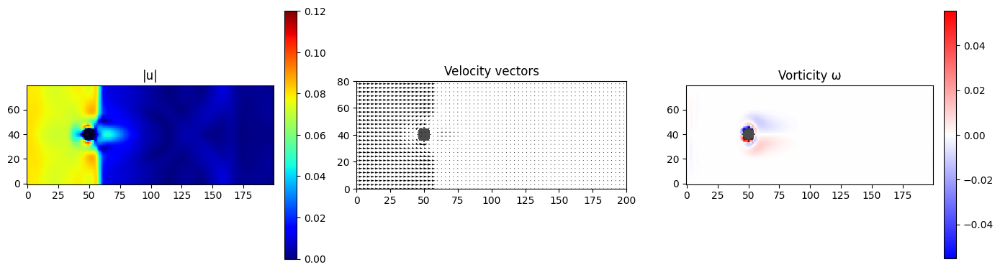

In [12]:
# Запуск симуляции и анимации
ani = main()
from IPython.display import HTML
HTML(ani.to_jshtml())

Исследование зависимости структуры течения от числа Рейнольдса
| $\tau$ | $u_{in}$ | $Re_{eff}$ | Устойчивость | Вихри Кармана  |
|---|---|----|----|---|
| 0.6 | 0.3 | 9  |  Да  |  Нет |
| 0.55 | 0.8 | 47  |  Да  |  Нет |
| 0.53 | 0.1 | 99  |   Начало неустойчивости | Да  |

$Re_{eff} = 99$

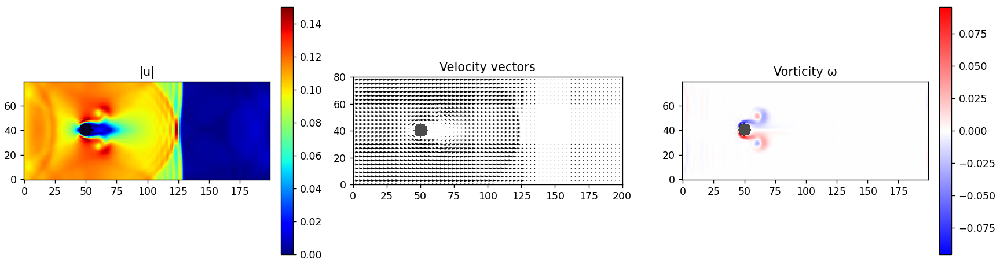